In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as feature
import scipy
from cartopy.util import add_cyclic_point

import xesmf as xe
import random
import matplotlib.colors as mcolors


In [2]:
def monthly_to_annual(array):
    """calculate annual mena from monthly data, using unequal month lengths fros noleap calendar.
    originally written by Keith Lindsay."""
    mon_day = xr.DataArray(
        np.array([31.0, 28.0, 31.0, 30.0, 31.0, 30.0, 31.0, 31.0, 30.0, 31.0, 30.0, 31.0]),
        dims=["month"],
    )
    mon_wgt = mon_day / mon_day.sum()
    return (
        array.rolling(time=12, center=False)  # rolling
        .construct("month")  # construct the array
        .isel(
            time=slice(11, None, 12)
        )  # slice so that the first element is [1..12], second is [13..24]
        .dot(mon_wgt, dims=["month"])
    )

In [3]:
def weighted_median(data, weights):
    """
    Computes the weighted median of a 1D array.
    """
    data = np.array(data)
    weights = np.array(weights)
    
    # Sort data and weights synchronously
    ind = np.argsort(data)
    sorted_data = data[ind]
    sorted_weights = weights[ind]
    
    # Calculate cumulative sum of weights
    cumsum_weights = np.cumsum(sorted_weights)
    
    # Find the 50% threshold cutoff
    cutoff = np.sum(sorted_weights) / 2.0
    
    # Return the first value that meets or exceeds the cutoff
    return sorted_data[cumsum_weights >= cutoff][0]

In [4]:
datadir = '/Users/CDKoven/datasets/flat10MIP_analysis/flat10/'

model_list = ['CESM2']

exp_list = ['flat10','flat10-zec','flat10-cdr']
exp_list_underscore = ['flat10','flat10_zec','flat10_cdr']
exp_list_giss = ['Flat10','Flat10zec','Flat10cdr']

year_ave_start = [85,85,85]
year_time_start = [0,100,100]

averaging_length = 30

sampling_string = str(averaging_length)+'YS'

picontrols_dict = {}

landmasks_dict = {}
areas_dict = {}

In [5]:
#precip_levs = (np.arange(40.)/10.-2.)*2e-6
precip_levs = (np.arange(40.)/10.-2.)*1e2

unit_conv_mps_to_kgm2s = 1000
unit_conv_mmyr_to_kgm2s = 1./(86400.*365.)

persec_to_peryear = 86400. * 365.


/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/conventions.py:543: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/conventions.py:543: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/conventions.py:543: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/conventions.py:543: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-package

<xarray.DataArray 'pr' (lat: 192, lon: 288)>
dask.array<mul, shape=(192, 288), dtype=float32, chunksize=(192, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
<xarray.DataArray 'pr' (lat: 192, lon: 288)>
dask.array<mul, shape=(192, 288), dtype=float32, chunksize=(192, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
<xarray.DataArray 'pr' (lat: 192, lon: 288)>
dask.array<mul, shape=(192, 288), dtype=float32, chunksize=(192, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8


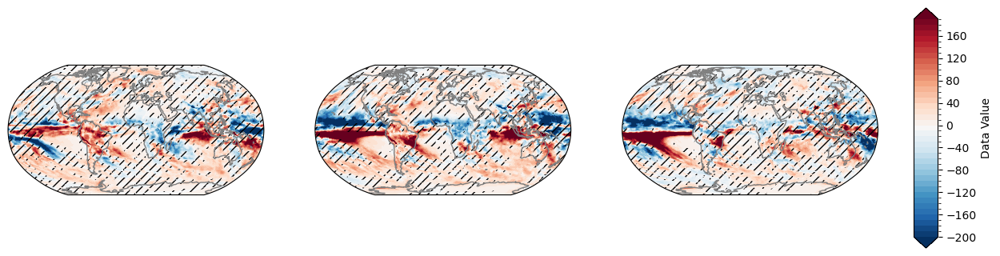

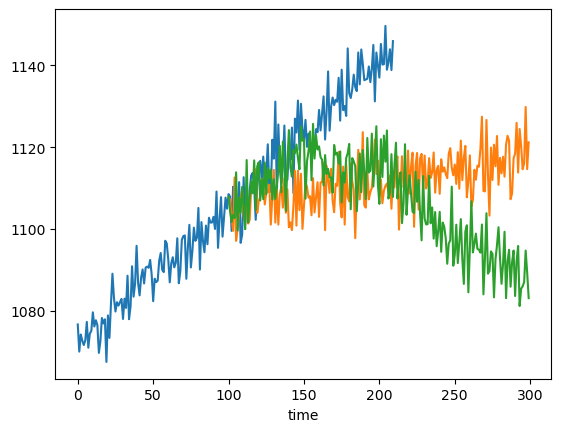

In [6]:
filenames = ['b.e21.B1850.f09_g17.FLAT10-esm.001.cam.h0.ts.allyears.pr.nc',
             'b.e21.B1850.f09_g17.FLAT10-zec.001.cam.h0.ts.allyears.pr.nc',
             'b.e21.B1850.f09_g17.FLAT10-cdr.001.cam.h0.ts.allyears.pr.nc']

area = xr.open_dataset(datadir + 'CESM2/flat10/b.e21.B1850.f09_g17.FLAT10-esm.001.areacella.nc')['areacella'].squeeze()
areas_dict['CESM2']= area
ts_in_cesm = []

### get land/ocean mask
landmasks_dict['CESM2'] = xr.open_dataset(datadir + 'CESM2/flat10/b.e21.B1850.f09_g17.FLAT10-esm.001.sftlf.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'CESM2/esm-piControl/pr_Amon_CESM2_esm-piControl_r*')
variance_20year_picontrol_cesm = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time')
picontrols_dict['CESM2'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_cesm = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'CESM2' + '/' + exp_list[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_cesm.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_cesm.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_cesm[1]-data_in_cesm[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_cesm[2]-data_in_cesm[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_cesm[2]-data_in_cesm[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol

hatch1 = np.abs(data_in_cesm[1]-data_in_cesm[0]) < np.sqrt(variance_20year_picontrol_cesm)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = np.abs(data_in_cesm[2]-data_in_cesm[0]) < np.sqrt(variance_20year_picontrol_cesm)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = np.abs(data_in_cesm[2]-data_in_cesm[1]) < np.sqrt(variance_20year_picontrol_cesm)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))


fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

    
ts_in_cesm[0].plot()
ts_in_cesm[1].plot()
ts_in_cesm[2].plot()
plt.show()


/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

<xarray.DataArray 'pr' (lat: 180, lon: 288)>
dask.array<mul, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4


/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

<xarray.DataArray 'pr' (lat: 180, lon: 288)>
dask.array<mul, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4


/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Use

<xarray.DataArray 'pr' (lat: 180, lon: 288)>
dask.array<mul, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

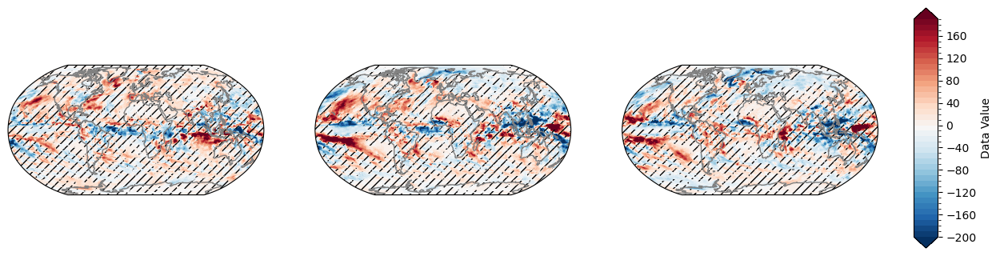

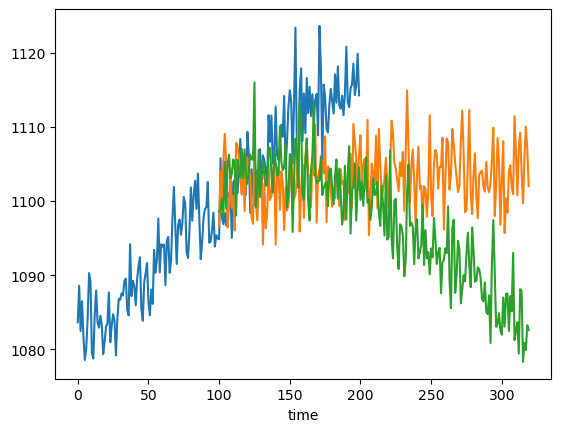

In [7]:
filenames = ['pr_Amon_GFDL-ESM4_flat10_r1i1p1f1_gr_*.nc',
             'pr_Amon_GFDL-ESM4_flat10-zec_r1i1p1f1_gr_*.nc',
             'pr_Amon_GFDL-ESM4_flat10-cdr_r1i1p1f1_gr_*.nc']

area = xr.open_dataset(datadir + 'GFDL-ESM4/flat10/areacella_fx_GFDL-ESM4_flat10_r1i1p1f1_gr.nc')['areacella'].squeeze()
areas_dict['GFDL-ESM4']= area
ts_in_gfdl = []

### get land/ocean mask
landmasks_dict['GFDL-ESM4'] = xr.open_dataset(datadir + 'GFDL-ESM4/flat10/sftlf_fx_GFDL-ESM4_flat10_r1i1p1f1_gr.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'GFDL-ESM4/esm-piControl/pr_Amon_GFDL-ESM4_esm-piControl_r*')
variance_20year_picontrol_gfdl = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['GFDL-ESM4'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_gfdl = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'GFDL-ESM4' + '/' + exp_list[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_gfdl.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_gfdl.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_gfdl[1]-data_in_gfdl[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_gfdl[2]-data_in_gfdl[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_gfdl[2]-data_in_gfdl[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

hatch1 = np.abs(data_in_gfdl[1]-data_in_gfdl[0]) < np.sqrt(variance_20year_picontrol_gfdl)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = np.abs(data_in_gfdl[2]-data_in_gfdl[0]) < np.sqrt(variance_20year_picontrol_gfdl)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = np.abs(data_in_gfdl[2]-data_in_gfdl[1]) < np.sqrt(variance_20year_picontrol_gfdl)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_gfdl[0].plot()
ts_in_gfdl[1].plot()
ts_in_gfdl[2].plot()
plt.show()
    

<xarray.DataArray 'precipitation_flux' (lat: 144, lon: 192)>
dask.array<mul, shape=(144, 192), dtype=float32, chunksize=(144, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat                      (lat) float32 -89.38 -88.12 -86.88 ... 88.12 89.38
  * lon                      (lon) float32 0.9375 2.812 4.688 ... 357.2 359.1
    forecast_reference_time  object ...
<xarray.DataArray 'precipitation_flux' (lat: 144, lon: 192)>
dask.array<mul, shape=(144, 192), dtype=float32, chunksize=(144, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat                      (lat) float32 -89.38 -88.12 -86.88 ... 88.12 89.38
  * lon                      (lon) float32 0.9375 2.812 4.688 ... 357.2 359.1
    forecast_reference_time  object ...
<xarray.DataArray 'precipitation_flux' (lat: 144, lon: 192)>
dask.array<mul, shape=(144, 192), dtype=float32, chunksize=(144, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat                      (lat) float32 -89.38 -88.12 -86.88 ... 88.12 89.38
  * lon       

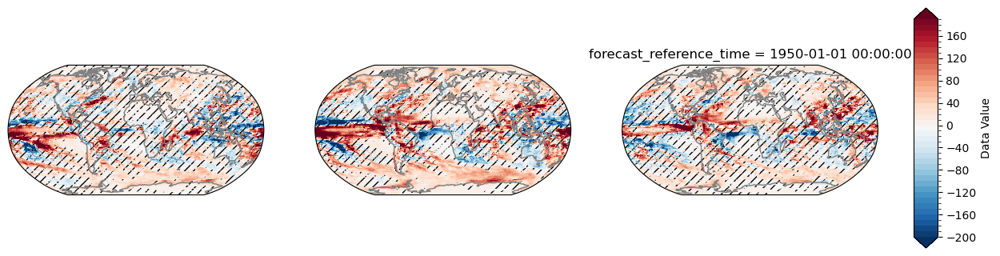

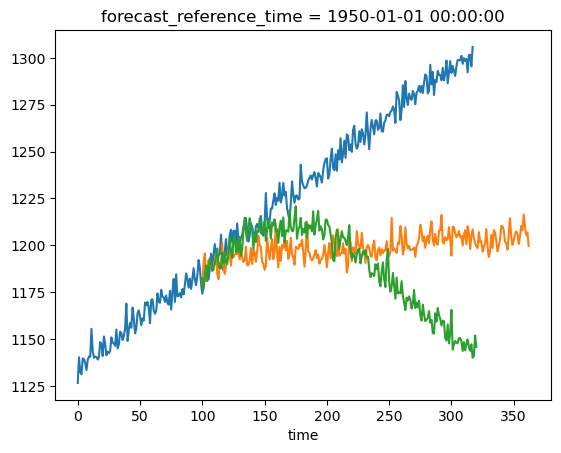

In [8]:
filenames = ['dg403_flat10_pr.nc',
             'dg492_flat10-zec_pr.nc',
             'dg493_flat10-cdr_pr.nc']

area = xr.open_dataset(datadir + 'UKESM1.2/flat10/areacella_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc')['areacella'].squeeze()
areas_dict['UKESM1.2']= area

ts_in_ukesm = []

### get land/ocean mask
landmasks_dict['UKESM1.2'] = xr.open_dataset(datadir + 'UKESM1.2/flat10/sftlf_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'UKESM1.2/esm-piControl/pr_Amon_UKESM1-0-LL_esm-piControl_*')
variance_20year_picontrol_ukesm = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['UKESM1.2'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_ukesm = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'UKESM1.2' + '/' + exp_list[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname).rename({'latitude': 'lat', 'longitude':'lon'})
    pr_mean = ds['precipitation_flux'].isel(time=slice(year_ave_start[exp_i], (year_ave_start[exp_i]+averaging_length))).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_ukesm.append(pr_mean)
    pr_ts = ((ds['precipitation_flux'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_ukesm.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_ukesm[1]-data_in_ukesm[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_ukesm[2]-data_in_ukesm[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_ukesm[2]-data_in_ukesm[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_ukesm[1]-data_in_ukesm[0])) < np.sqrt(variance_20year_picontrol_ukesm)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_ukesm[2]-data_in_ukesm[0])) < np.sqrt(variance_20year_picontrol_ukesm)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_ukesm[2]-data_in_ukesm[1])) < np.sqrt(variance_20year_picontrol_ukesm)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_ukesm[0].plot()
ts_in_ukesm[1].plot()
ts_in_ukesm[2].plot()
plt.show()

<xarray.DataArray 'pr' (lat: 64, lon: 128)>
dask.array<mul, shape=(64, 128), dtype=float32, chunksize=(64, 128), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * lat      (lat) float64 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86
<xarray.DataArray 'pr' (lat: 64, lon: 128)>
dask.array<mul, shape=(64, 128), dtype=float32, chunksize=(64, 128), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * lat      (lat) float64 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86
<xarray.DataArray 'pr' (lat: 64, lon: 128)>
dask.array<mul, shape=(64, 128), dtype=float32, chunksize=(64, 128), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * lat      (lat) float64 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86


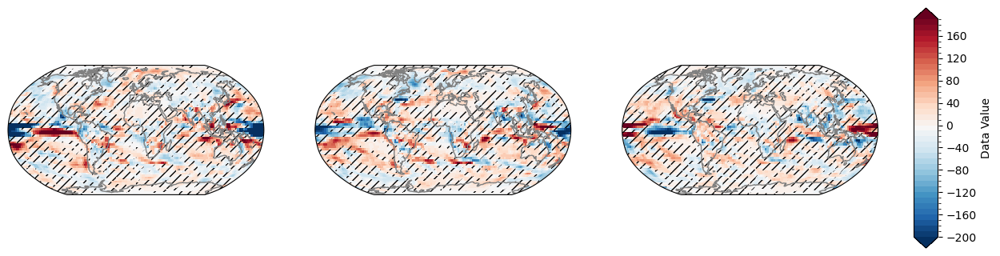

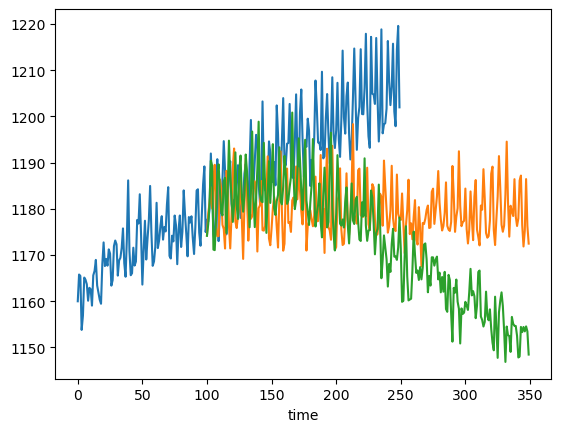

In [9]:
filenames = ['pr_flat10_miroc-es2l.nc',
             'pr_flat10zec_miroc-es2l.nc',
             'pr_flat10cdr_miroc-es2l.nc']

area = xr.open_dataset(datadir + 'miroc-es2l/flat10/miroc-es2l_areacella.nc')['areacella'].squeeze()
areas_dict['MIROC-ES2L']= area

ts_in_miroc = []

### get land/ocean mask
landmasks_dict['MIROC-ES2L'] = xr.open_dataset(datadir + 'miroc-es2l/flat10/miroc-es2l_sftlf.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'miroc-es2l/esm-piControl/pr_Amon_MIROC-ES2L_esm-piControl_*', use_cftime=True)
variance_20year_picontrol_miroc = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['MIROC-ES2L'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_miroc = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'miroc-es2l' + '/' + exp_list_underscore[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_miroc.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_miroc.append(pr_ts)
    ds.close()

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_miroc[1]-data_in_miroc[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_miroc[2]-data_in_miroc[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_miroc[2]-data_in_miroc[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_miroc[1]-data_in_miroc[0])) < np.sqrt(variance_20year_picontrol_miroc)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_miroc[2]-data_in_miroc[0])) < np.sqrt(variance_20year_picontrol_miroc)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_miroc[2]-data_in_miroc[1])) < np.sqrt(variance_20year_picontrol_miroc)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_miroc[0].plot()
ts_in_miroc[1].plot()
ts_in_miroc[2].plot()
plt.show() 

/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)
/Users/CDKoven/miniforge3/envs

<xarray.DataArray 'pr' (lat: 96, lon: 192)>
dask.array<mul, shape=(96, 192), dtype=float32, chunksize=(96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
<xarray.DataArray 'pr' (lat: 96, lon: 192)>
dask.array<mul, shape=(96, 192), dtype=float32, chunksize=(96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
<xarray.DataArray 'pr' (lat: 96, lon: 192)>
dask.array<mul, shape=(96, 192), dtype=float32, chunksize=(96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57


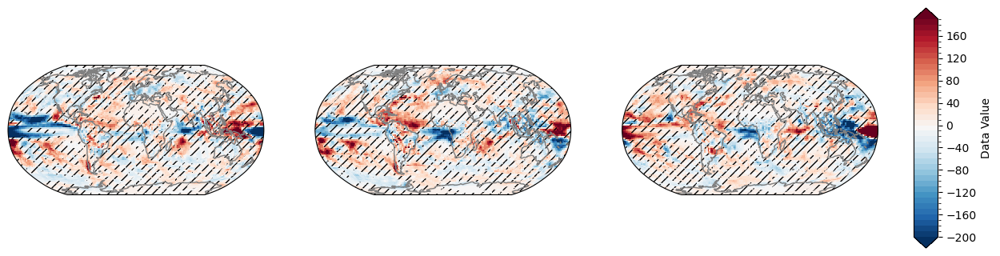

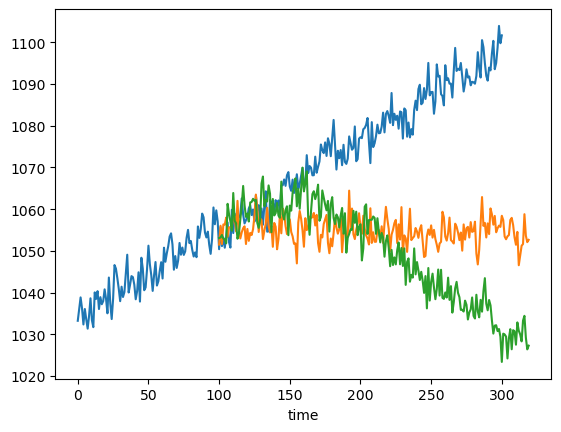

In [10]:
filenames = ['flat10_pr_MPI-ESM1-2-LR.nc',
             'flat10_zec_pr_MPI-ESM1-2-LR.nc',
             'flat10_cdr_pr_MPI-ESM1-2-LR.nc']
area = xr.open_dataset(datadir + 'MPI-ESM1-2-LR/esm-piControl/areacella_fx_MPI-ESM1-2-LR_esm-piControl_r1i1p1f1_gn.nc')['areacella'].squeeze()
areas_dict['MPI-ESM1-2-LR']= area

ts_in_mpi = []

### get land/ocean mask
landmasks_dict['MPI-ESM1-2-LR'] = xr.open_dataset(datadir + 'MPI-ESM1-2-LR/esm-piControl/sftlf_fx_MPI-ESM1-2-LR_esm-piControl_r1i1p1f1_gn.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'MPI-ESM1-2-LR/esm-piControl/esm-piControl_pr_MPI-ESM1-2-LR.nc')
picontrol['lat'] = area.lat
picontrol['lon'] = area.lon
variance_20year_picontrol_mpi = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['MPI-ESM1-2-LR'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_mpi = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'MPI-ESM1-2-LR' + '/' + exp_list_underscore[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    ds['lat'] = area.lat
    ds['lon'] = area.lon
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_mpi.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_mpi.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_mpi[1]-data_in_mpi[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_mpi[2]-data_in_mpi[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_mpi[2]-data_in_mpi[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_mpi[1]-data_in_mpi[0])) < np.sqrt(variance_20year_picontrol_mpi)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_mpi[2]-data_in_mpi[0])) < np.sqrt(variance_20year_picontrol_mpi)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_mpi[2]-data_in_mpi[1])) < np.sqrt(variance_20year_picontrol_mpi)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_mpi[0].plot()
ts_in_mpi[1].plot()
ts_in_mpi[2].plot()
plt.show()     

<xarray.DataArray 'precip_mm_srf' (lat: 73, lon: 96)>
dask.array<mul, shape=(73, 96), dtype=float32, chunksize=(73, 96), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    surface  float32 ...
<xarray.DataArray 'precip_mm_srf' (lat: 73, lon: 96)>
dask.array<mul, shape=(73, 96), dtype=float32, chunksize=(73, 96), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    surface  float32 ...
<xarray.DataArray 'precip_mm_srf' (lat: 73, lon: 96)>
dask.array<mul, shape=(73, 96), dtype=float32, chunksize=(73, 96), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 35

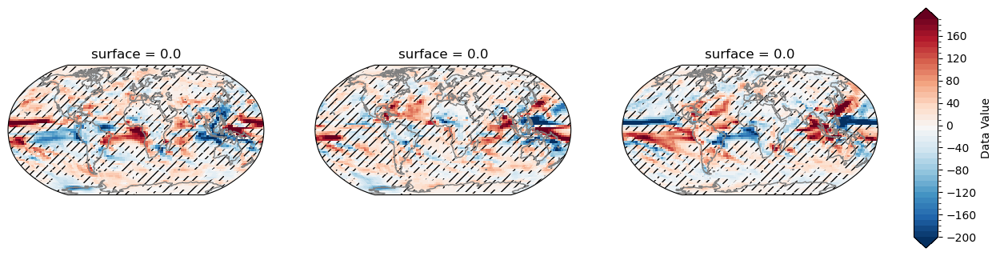

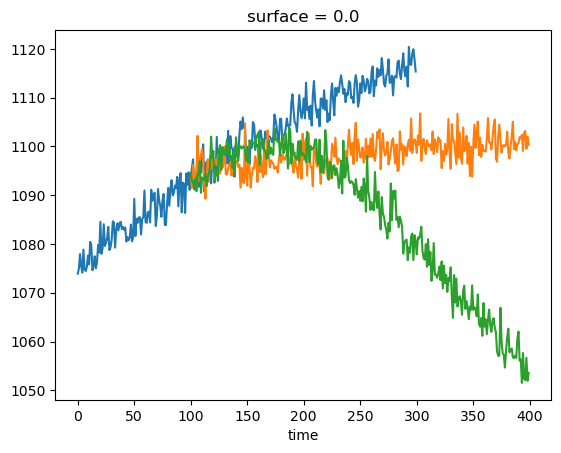

In [11]:
filenames = ['flat10_pr_annual_full2D_HadCM3LC-Bris.nc',
             'flat10-zec_pr_annual_full2D_HadCM3LC-Bris.nc',
             'flat10-cdr_pr_annual_full2D_HadCM3LC-Bris.nc']

area = xr.open_dataset(datadir + 'HadCM3LC-Bris/fx/areacella_fx_HadCM3Bris_gn.nc')['cell_area'].squeeze().rename({'latitude': 'lat', 'longitude':'lon'})
areas_dict['HadCM3LC-Bris']= area

ts_in_hadcm3lc3 = []

### get land/ocean mask
landmasks_dict['HadCM3LC-Bris'] = xr.open_dataset(datadir + 'HadCM3LC-Bris/fx/sftlf_fx_HadCM3Bris_gn.nc')['land_area_fraction'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'HadCM3LC-Bris/esm-pictrl/esm-pictrl_pr_annual_full2D_HadCM3LC-Bris.nc').rename({'latitude': 'lat', 'longitude':'lon'})
variance_20year_picontrol_hadcm3lc3 = (picontrol['precip_mm_srf']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['HadCM3LC-Bris'] = picontrol['precip_mm_srf'] * persec_to_peryear

data_in_hadcm3lc3 = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'HadCM3LC-Bris' + '/' + exp_list[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname).rename({'latitude': 'lat', 'longitude':'lon'})
    pr_mean = ds['precip_mm_srf'].isel(time=slice(year_ave_start[exp_i], (year_ave_start[exp_i]+averaging_length))).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_hadcm3lc3.append(pr_mean)
    pr_ts = ((ds['precip_mm_srf'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_hadcm3lc3.append(pr_ts)


fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_hadcm3lc3[1]-data_in_hadcm3lc3[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_hadcm3lc3[2]-data_in_hadcm3lc3[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_hadcm3lc3[2]-data_in_hadcm3lc3[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_hadcm3lc3[1]-data_in_hadcm3lc3[0])) < np.sqrt(variance_20year_picontrol_hadcm3lc3)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_hadcm3lc3[2]-data_in_hadcm3lc3[0])) < np.sqrt(variance_20year_picontrol_hadcm3lc3)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_hadcm3lc3[2]-data_in_hadcm3lc3[1])) < np.sqrt(variance_20year_picontrol_hadcm3lc3)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_hadcm3lc3[0].plot()
ts_in_hadcm3lc3[1].plot()
ts_in_hadcm3lc3[2].plot()
plt.show()     

<xarray.DataArray (lat: 96, lon: 144)>
dask.array<mul, shape=(96, 144), dtype=float32, chunksize=(96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
<xarray.DataArray (lat: 96, lon: 144)>
dask.array<mul, shape=(96, 144), dtype=float32, chunksize=(96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
<xarray.DataArray (lat: 96, lon: 144)>
dask.array<mul, shape=(96, 144), dtype=float32, chunksize=(96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5


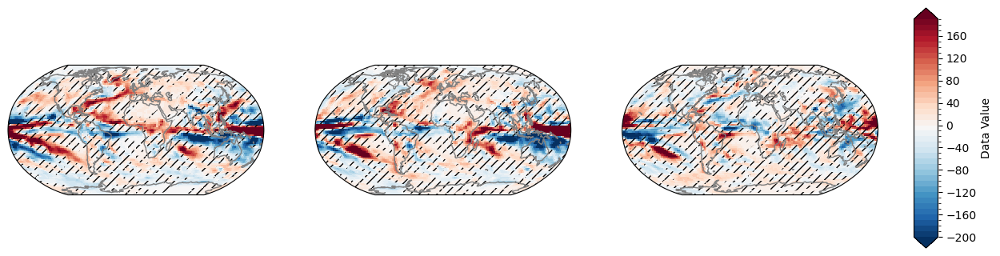

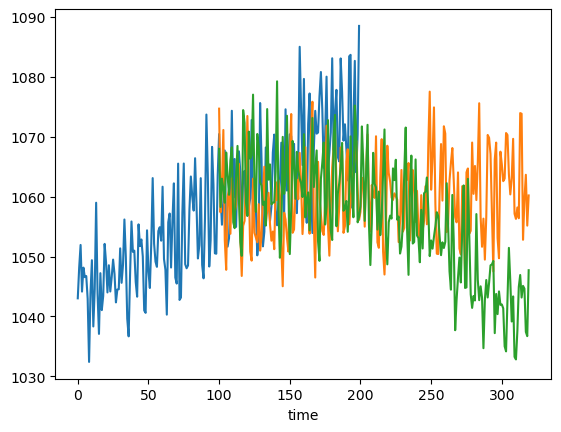

In [12]:
filenames = ['prc_NorESM2-LM_flat10_*.nc',
             'prc_NorESM2-LM_flat10_zec_*.nc',
             'prc_NorESM2-LM_flat10_cdr_*.nc']
area = xr.open_dataset(datadir + 'NorESM2-LM/flat10/areacella_fx_NorESM2-LM_flat10_r1i1p1f1_gn.nc')['areacella'].squeeze()
areas_dict['NorESM2-LM']= area

ts_in_noresm = []

### get land/ocean mask
landmasks_dict['NorESM2-LM'] = xr.open_dataset(datadir + 'NorESM2-LM/flat10/sftlf_fx_NorESM2-LM_flat10_r1i1p1f1_gn.nc')['sftlf'].squeeze()

### load pi control data
############ NOTE ALSO THIS IS THE PICONTROL NOT THE ESMPICONTROL. I COULDN'T GET ESMPICONTROL FOR NORESM#####
picontrol = xr.open_mfdataset(datadir + 'NorESM2-LM/esm-piControl/pr_Amon_NorESM2-LM_piControl_r1i1p1f1_gn*.nc')
variance_20year_picontrol_noresm = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['NorESM2-LM'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_noresm = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'NorESM2-LM' + '/' + exp_list_underscore[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    ds['lat'] = area.lat
    ds['lon'] = area.lon
    ########################################################################################################
    pr_mean = (ds['PRECC']+ds['PRECL']).isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * unit_conv_mps_to_kgm2s * persec_to_peryear
    print(pr_mean)
    data_in_noresm.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['PRECC']+ds['PRECL'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon'])* unit_conv_mps_to_kgm2s * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_noresm.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_noresm[1]-data_in_noresm[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_noresm[2]-data_in_noresm[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_noresm[2]-data_in_noresm[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_noresm[1]-data_in_noresm[0])) < np.sqrt(variance_20year_picontrol_noresm)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_noresm[2]-data_in_noresm[0])) < np.sqrt(variance_20year_picontrol_noresm)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_noresm[2]-data_in_noresm[1])) < np.sqrt(variance_20year_picontrol_noresm)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

    
ts_in_noresm[0].plot()
ts_in_noresm[1].plot()
ts_in_noresm[2].plot()
plt.show()   

<xarray.DataArray 'prec' (lat: 90, lon: 144)>
dask.array<mul, shape=(90, 144), dtype=float32, chunksize=(90, 144), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
<xarray.DataArray 'prec' (lat: 90, lon: 144)>
dask.array<mul, shape=(90, 144), dtype=float32, chunksize=(90, 144), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
<xarray.DataArray 'prec' (lat: 90, lon: 144)>
dask.array<mul, shape=(90, 144), dtype=float32, chunksize=(90, 144), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0


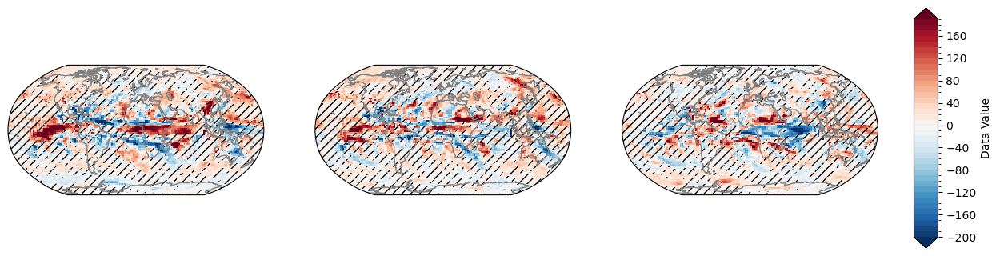

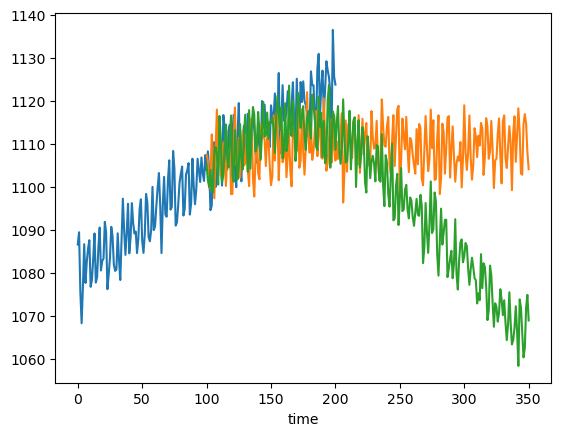

In [13]:
filenames = ['C_ANN_GISSE21obio12_esmflat10_2026-04-09.nc',
             'C_ANN_GISSE21obio12_esmflat10zec_2026-04-09.nc',
             'C_ANN_GISSE21obio12_esmflat10cdr_2026-04-09.nc']

area = xr.open_dataset(datadir + 'GISS_E2.1/Flat10/areacella_fx_GISS-E2-1-G_piControl_r1i1p5f1_gn.nc')['areacella'].squeeze()
areas_dict['GISS_E2.1']= area

ts_in_giss = []

### get land/ocean mask
landmasks_dict['GISS_E2.1'] = xr.open_dataset(datadir + 'GISS_E2.1/Flat10/sftlf_fx_GISS-E2-1-G_piControl_r1i1p1f1_gn.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'GISS_E2.1/esm-piControl/pr_Amon_GISS-E2-1-G-CC_esm-piControl_r1i1p1f1_gn*.nc')
picontrol['lat'] = area.lat
picontrol['lon'] = area.lon
variance_20year_picontrol_giss = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['GISS_E2.1'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_giss = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'GISS_E2.1' + '/' + exp_list_giss[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname).rename({'year':'time'})
    ds['lat'] = area.lat
    ds['lon'] = area.lon
    pr_mean = ds['prec'].isel(time=slice(year_ave_start[exp_i], (year_ave_start[exp_i]+averaging_length))).mean(dim='time') * unit_conv_mmyr_to_kgm2s * persec_to_peryear
    print(pr_mean)
    data_in_giss.append(pr_mean)
    pr_ts = ((ds['prec'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * unit_conv_mmyr_to_kgm2s * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_giss.append(pr_ts)


fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_giss[1]-data_in_giss[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_giss[2]-data_in_giss[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_giss[2]-data_in_giss[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_giss[1]-data_in_giss[0])) < np.sqrt(variance_20year_picontrol_giss)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_giss[2]-data_in_giss[0])) < np.sqrt(variance_20year_picontrol_giss)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_giss[2]-data_in_giss[1])) < np.sqrt(variance_20year_picontrol_giss)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

ts_in_giss[0].plot()
ts_in_giss[1].plot()
ts_in_giss[2].plot()
plt.show()     

<xarray.DataArray 'pr' (lat: 128, lon: 256)>
dask.array<mul, shape=(128, 256), dtype=float32, chunksize=(128, 256), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.93 -87.54 -86.14 -84.74 ... 86.14 87.54 88.93
  * lon      (lon) float64 0.0 1.406 2.812 4.219 ... 354.4 355.8 357.2 358.6
<xarray.DataArray 'pr' (lat: 128, lon: 256)>
dask.array<mul, shape=(128, 256), dtype=float32, chunksize=(128, 256), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.93 -87.54 -86.14 -84.74 ... 86.14 87.54 88.93
  * lon      (lon) float64 0.0 1.406 2.812 4.219 ... 354.4 355.8 357.2 358.6
<xarray.DataArray 'pr' (lat: 128, lon: 256)>
dask.array<mul, shape=(128, 256), dtype=float32, chunksize=(128, 256), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.93 -87.54 -86.14 -84.74 ... 86.14 87.54 88.93
  * lon      (lon) float64 0.0 1.406 2.812 4.219 ... 354.4 355.8 357.2 358.6


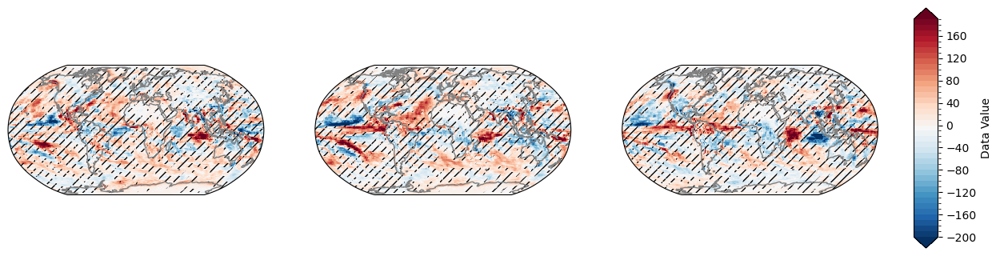

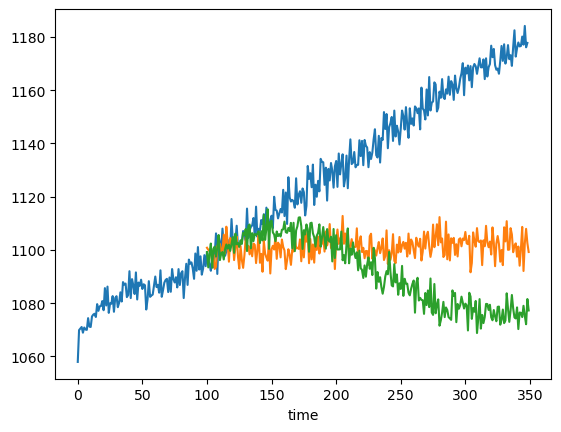

In [14]:
filenames = ['pr_Amon_CNRM-ESM2-1_flat10_r1i1p2f2_gr_*',
             'pr_Amon_CNRM-ESM2-1_flat10-zec_r1i1p2f2_gr_*',
             'pr_Amon_CNRM-ESM2-1_flat10-cdr_r1i1p2f2_gr_*']
area = xr.open_dataset(datadir + 'CNRM-ESM2-1/flat10/areacella_fx_CNRM-ESM2-1_esm-piControl_r1i1p2f2_gr.nc')['areacella'].squeeze()
areas_dict['CNRM-ESM2-1']= area

ts_in_cnrm = []

### get land/ocean mask
landmasks_dict['CNRM-ESM2-1'] = xr.open_dataset(datadir + 'CNRM-ESM2-1/esm-piControl/sftlf_fx_CNRM-ESM2-1_esm-piControl_r1i1p2f2_gr.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'CNRM-ESM2-1/esm-piControl/pr_Amon_CNRM-ESM2-1_esm-piControl_r1i1p1f2_gr_*.nc', use_cftime=True)
variance_20year_picontrol_cnrm = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['CNRM-ESM2-1'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_cnrm = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'CNRM-ESM2-1' + '/' + exp_list[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_cnrm.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_cnrm.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_cnrm[1]-data_in_cnrm[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_cnrm[2]-data_in_cnrm[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_cnrm[2]-data_in_cnrm[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_cnrm[1]-data_in_cnrm[0])) < np.sqrt(variance_20year_picontrol_cnrm)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_cnrm[2]-data_in_cnrm[0])) < np.sqrt(variance_20year_picontrol_cnrm)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_cnrm[2]-data_in_cnrm[1])) < np.sqrt(variance_20year_picontrol_cnrm)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

    
ts_in_cnrm[0].plot()
ts_in_cnrm[1].plot()
ts_in_cnrm[2].plot()
plt.show()   

/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:153: SerializationWarning: Ambiguous reference date string: 271-01-01. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0271-01-01). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/CDKoven/miniforge3/envs/xesmf/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime

<xarray.DataArray 'pr' (lat: 145, lon: 192)>
dask.array<mul, shape=(145, 192), dtype=float32, chunksize=(145, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.75 -87.5 -86.25 ... 86.25 87.5 88.75 90.0
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
<xarray.DataArray 'pr' (lat: 145, lon: 192)>
dask.array<mul, shape=(145, 192), dtype=float32, chunksize=(145, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.75 -87.5 -86.25 ... 86.25 87.5 88.75 90.0
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
<xarray.DataArray 'pr' (lat: 145, lon: 192)>
dask.array<mul, shape=(145, 192), dtype=float32, chunksize=(145, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -88.75 -87.5 -86.25 ... 86.25 87.5 88.75 90.0
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1


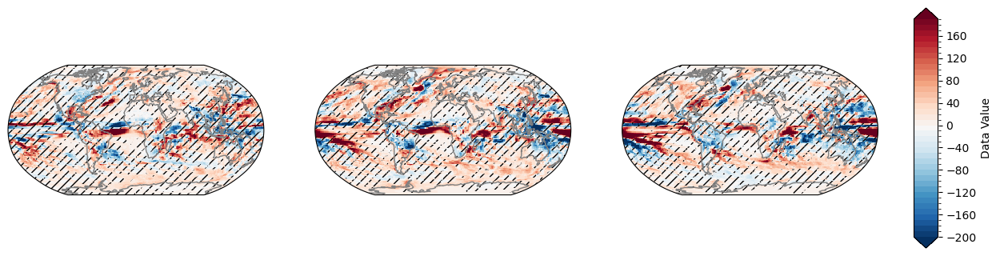

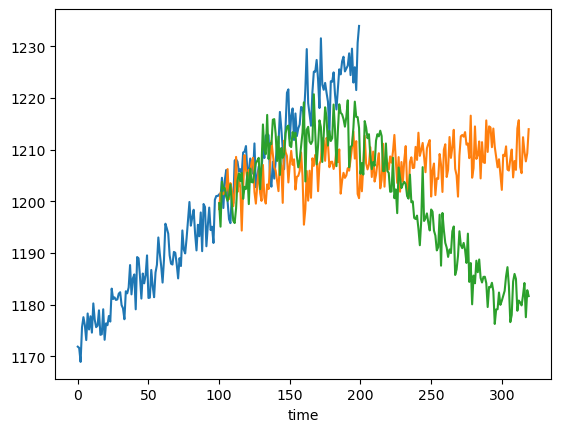

In [15]:
filenames = ['pr_Amon_ACCESS-ESM1-5_flat10_r1i1p1f2_gn_*.nc',
             'pr_Amon_ACCESS-ESM1-5_flat10_zec_r1i1p1f2_gn_*.nc',
             'pr_Amon_ACCESS-ESM1-5_flat10_cdr_r1i1p1f3_gn_*.nc']

area = xr.open_dataset(datadir + 'ACCESS-ESM1-5/flat10/areacella_fx_ACCESS-ESM1-5_flat10_r1i1p1f2_gn.nc')['areacella'].squeeze()
areas_dict['ACCESS-ESM1-5']= area

ts_in_access = []

### get land/ocean mask
landmasks_dict['ACCESS-ESM1-5'] = xr.open_dataset(datadir + 'ACCESS-ESM1-5/flat10/sftlf_fx_ACCESS-ESM1-5_flat10_r1i1p1f2_gn.nc')['sftlf'].squeeze()

### load pi control data
picontrol = xr.open_mfdataset(datadir + 'ACCESS-ESM1-5/esm-piControl/pr_Amon_ACCESS-ESM1-5_esm-piControl_r1i1p1f1*')
variance_20year_picontrol_access = (picontrol['pr']*persec_to_peryear).resample(time=sampling_string).mean(dim='time').var(dim='time').squeeze()
picontrols_dict['ACCESS-ESM1-5'] = monthly_to_annual(picontrol['pr']) * persec_to_peryear

data_in_access = []
for exp_i in range(len(exp_list)):
    fname = datadir + 'ACCESS-ESM1-5' + '/' + exp_list_underscore[exp_i] + '/' + filenames[exp_i]
    ds = xr.open_mfdataset(fname)
    pr_mean = ds['pr'].isel(time=slice(year_ave_start[exp_i]*12, (year_ave_start[exp_i]+averaging_length)*12)).mean(dim='time') * persec_to_peryear
    print(pr_mean)
    data_in_access.append(pr_mean)
    pr_ts = (monthly_to_annual(ds['pr'])*area).sum(dim=['lat','lon'])/area.sum(dim=['lat','lon']) * persec_to_peryear
    pr_ts['time'] = np.arange(len(pr_ts.time))+year_time_start[exp_i]
    ts_in_access.append(pr_ts)

fig, axs = plt.subplots(1, 3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})

p = (data_in_access[1]-data_in_access[0]).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_access[2]-data_in_access[0]).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')

(data_in_access[2]-data_in_access[1]).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

### add hatching for where the change is less than on std deviation of the picontrol
hatch1 = (np.abs(data_in_access[1]-data_in_access[0])) < np.sqrt(variance_20year_picontrol_access)
hatch1.plot.contourf(ax=axs[0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch2 = (np.abs(data_in_access[2]-data_in_access[0])) < np.sqrt(variance_20year_picontrol_access)
hatch2.plot.contourf(ax=axs[1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

hatch3 = (np.abs(data_in_access[2]-data_in_access[1])) < np.sqrt(variance_20year_picontrol_access)
hatch3.plot.contourf(ax=axs[2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6]) # [left, bottom, width, height]
fig.colorbar(p, cbar_ax, label='Data Value')
    
plt.show()

    
ts_in_access[0].plot()
ts_in_access[1].plot()
ts_in_access[2].plot()
plt.show()   

In [16]:
models_list = ['ACCESS-ESM1-5',
'CESM2',
'CNRM-ESM2-1',
'GFDL-ESM4',
'GISS_E2.1',
'HadCM3LC-Bris',
'MPI-ESM1-2-LR',
'NorESM2-LM',
'UKESM1.2',
'MIROC-ES2L']

nmodels = len(models_list)

data_dict = {'ACCESS-ESM1-5':data_in_access,
'CESM2':data_in_cesm,
'CNRM-ESM2-1':data_in_cnrm,
'GFDL-ESM4':data_in_gfdl,
'GISS_E2.1':data_in_giss,
'HadCM3LC-Bris':data_in_hadcm3lc3,
'MPI-ESM1-2-LR':data_in_mpi,
'NorESM2-LM':data_in_noresm,
'UKESM1.2':data_in_ukesm,
'MIROC-ES2L':data_in_miroc}

data_dict_ts = {'ACCESS-ESM1-5':ts_in_access,
'CESM2':ts_in_cesm,
'CNRM-ESM2-1':ts_in_cnrm,
'GFDL-ESM4':ts_in_gfdl,
'GISS_E2.1':ts_in_giss,
'HadCM3LC-Bris':ts_in_hadcm3lc3,
'MPI-ESM1-2-LR':ts_in_mpi,
'NorESM2-LM':ts_in_noresm,
'UKESM1.2':ts_in_ukesm,
'MIROC-ES2L':ts_in_miroc}

variance_20year_picontrol_dict = {'ACCESS-ESM1-5':variance_20year_picontrol_access,
'CESM2':variance_20year_picontrol_cesm,
'CNRM-ESM2-1':variance_20year_picontrol_cnrm,
'GFDL-ESM4':variance_20year_picontrol_gfdl,
'GISS_E2.1':variance_20year_picontrol_giss,
'HadCM3LC-Bris':variance_20year_picontrol_hadcm3lc3,
'MPI-ESM1-2-LR':variance_20year_picontrol_mpi,
'NorESM2-LM':variance_20year_picontrol_noresm,
'UKESM1.2':variance_20year_picontrol_ukesm,
'MIROC-ES2L':variance_20year_picontrol_miroc}



In [17]:
n_samples = 1000
rng = np.random.default_rng()
sampling_length = averaging_length
quantile_to_use = .05

lower_quantile = {}
upper_quantile = {}

mean_variance_dict = {}
median_variance_dict = {}
variance_of_variance_dict = {}
variances_dict = {}

for model_i, model in enumerate(models_list):
    n_startingyears = len(picontrols_dict[model].time) - sampling_length
    starting_indices_1 = rng.integers(low=0, high=n_startingyears, size=n_samples*2)  
    starting_indices_2 = rng.integers(low=0, high=n_startingyears, size=n_samples*2)  
    i_sample = 0
    i_counter = 0
    blank_da = xr.zeros_like(picontrols_dict[model].isel(time=0).squeeze())
    sampled_diffs = blank_da.expand_dims(sample=n_samples)
    print(sampled_diffs)
    while i_sample < n_samples:
        a = starting_indices_1[i_counter]
        b = starting_indices_2[i_counter]
        if abs(a - b) > sampling_length:
            sampled_diffs[i_sample,:,:] = picontrols_dict[model].isel(time=slice(a,a+sampling_length)).mean(dim='time') - picontrols_dict[model].isel(time=slice(b,b+sampling_length)).mean(dim='time')
            i_sample = i_sample+1
        i_counter = i_counter + 1
    sampled_diffs = sampled_diffs.compute()
    lower_quantile[model] = sampled_diffs.quantile(quantile_to_use, dim='sample').squeeze()
    upper_quantile[model] = sampled_diffs.quantile(1.-quantile_to_use, dim='sample').squeeze()
    mean_variance_dict[model] = sampled_diffs.var(dim=['lat','lon']).mean(dim="sample").squeeze()
    variance_of_variance_dict[model] = sampled_diffs.var(dim=['lat','lon']).var(dim="sample").squeeze()
    median_variance_dict[model] = sampled_diffs.var(dim=['lat','lon']).median(dim="sample").squeeze()
    variances_dict[model] = sampled_diffs.var(dim=['lat','lon'])

    

<xarray.DataArray (sample: 1000, lat: 145, lon: 192)>
dask.array<broadcast_to, shape=(1000, 145, 192), dtype=float64, chunksize=(1000, 145, 192), chunktype=numpy.ndarray>
Coordinates:
    time     object 0271-12-16 12:00:00
  * lat      (lat) float64 -90.0 -88.75 -87.5 -86.25 ... 86.25 87.5 88.75 90.0
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
Dimensions without coordinates: sample
<xarray.DataArray (sample: 1000, lat: 192, lon: 288)>
dask.array<broadcast_to, shape=(1000, 192, 288), dtype=float64, chunksize=(1000, 192, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    time     object 0001-12-15 12:00:00
Dimensions without coordinates: sample


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

<xarray.DataArray (sample: 1000, lat: 128, lon: 256)>
dask.array<broadcast_to, shape=(1000, 128, 256), dtype=float64, chunksize=(1000, 128, 256), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.93 -87.54 -86.14 -84.74 ... 86.14 87.54 88.93
  * lon      (lon) float64 0.0 1.406 2.812 4.219 ... 354.4 355.8 357.2 358.6
    time     object 1850-12-16 12:00:00
Dimensions without coordinates: sample
<xarray.DataArray (sample: 1000, lat: 180, lon: 288)>
dask.array<broadcast_to, shape=(1000, 180, 288), dtype=float64, chunksize=(1000, 180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
    time     object 0001-12-16 12:00:00
Dimensions without coordinates: sample


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

<xarray.DataArray (sample: 1000, lat: 90, lon: 144)>
dask.array<broadcast_to, shape=(1000, 90, 144), dtype=float64, chunksize=(1000, 90, 144), chunktype=numpy.ndarray>
Coordinates:
    time     object 1850-12-16 12:00:00
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
Dimensions without coordinates: sample
<xarray.DataArray 'precip_mm_srf' (sample: 1000, lat: 73, lon: 96)>
dask.array<broadcast_to, shape=(1000, 73, 96), dtype=float32, chunksize=(1000, 73, 96), chunktype=numpy.ndarray>
Coordinates:
    time     object 1651-07-02 00:00:00
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    surface  float32 ...
    year     int64 dask.array<chunksize=(), meta=np.ndarray>
Dimensions without coordinates: sample
<xarray.DataArray (sample: 1000, lat: 96, lon: 192)>
dask.ar

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 0:
  #000: H5A.c line 528 in H5Ao

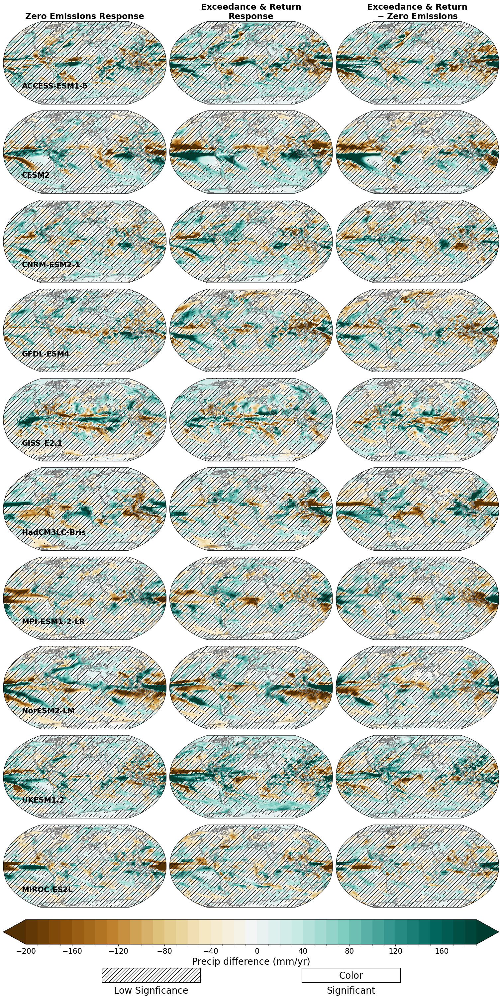

In [18]:
fig, axs = plt.subplots(nmodels+1, 3, figsize=(15, 30),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)},
                       constrained_layout=True)
p

cmap = 'BrBG'
for model_i, model in enumerate(models_list):
    data = data_dict[model]
    variance_20year_picontrol = variance_20year_picontrol_dict[model]
    #
    p = (data[1]-data[0]).plot(ax=axs[model_i,0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
    axs[model_i,0].add_feature(feature.COASTLINE, edgecolor='grey')
    #
    (data[2]-data[0]).plot(ax=axs[model_i,1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
    axs[model_i,1].add_feature(feature.COASTLINE, edgecolor='grey')
    #
    (data[2]-data[1]).plot(ax=axs[model_i,2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
    axs[model_i,2].add_feature(feature.COASTLINE, edgecolor='grey')
    #
    #
    ### add hatching for where the change is less than on std deviation of the picontrol
    hatch1 = 1.-(((data[1]-data[0]) < lower_quantile[model]) + ((data[1]-data[0]) > upper_quantile[model]))
    wrap_hatch1, wrap_lons = add_cyclic_point(hatch1, coord=hatch1.lon.as_numpy())
    wrap_hatch1_dataarray = xr.DataArray(wrap_hatch1, 
            coords={"lat": hatch1.lat, "lon": wrap_lons}, dims=("lat", "lon"))
    wrap_hatch1_dataarray.plot.contourf(ax=axs[model_i,0], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))
    #
    hatch2 = 1.-(((data[2]-data[0]) < lower_quantile[model]) + ((data[2]-data[0]) > upper_quantile[model]))
    wrap_hatch2, wrap_lons = add_cyclic_point(hatch2, coord=hatch2.lon.as_numpy())
    wrap_hatch2_dataarray = xr.DataArray(wrap_hatch2, 
            coords={"lat": hatch2.lat, "lon": wrap_lons}, dims=("lat", "lon"))
    wrap_hatch2_dataarray.plot.contourf(ax=axs[model_i,1], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))
    #
    hatch3 = 1.-(((data[2]-data[1]) < lower_quantile[model]) + ((data[2]-data[1]) > upper_quantile[model]))
    wrap_hatch3, wrap_lons = add_cyclic_point(hatch3, coord=hatch3.lon.as_numpy())
    wrap_hatch3_dataarray = xr.DataArray(wrap_hatch3, 
            coords={"lat": hatch1.lat, "lon": wrap_lons}, dims=("lat", "lon"))
    wrap_hatch3_dataarray.plot.contourf(ax=axs[model_i,2], transform=ccrs.PlateCarree(), colors='none', add_colorbar=False, levels=[0.5,1.5], hatches=('','///'))
    #

axs[nmodels, 0].axis('off')
axs[nmodels, 1].axis('off')
axs[nmodels, 2].axis('off')

# 3. Label the columns (set titles for the top row)
column_labels = ['Zero Emissions Response', 'Exceedance & Return\nResponse', 'Exceedance & Return\n$\minus$ Zero Emissions']
for ax, col in zip(axs[0, :], column_labels):
    ax.set_title(col, size=18, fontweight='bold')

for i in range(2,nmodels):
    for ax, col in zip(axs[i, :], column_labels):
        ax.set_title('')

# 4. Label the rows (set y-labels for the first column)
row_labels = models_list
for ax, row in zip(axs[:, 0], row_labels):
    ax.text(200., -50., row, transform=ccrs.Geodetic(), size=16, fontweight='bold')
    
#plt.tight_layout()

cbar = fig.colorbar(p, ax=axs.ravel().tolist(), orientation='horizontal', fraction=0.04, pad=-0.077, label='Precip difference (mm/yr)')
cbar.ax.tick_params(labelsize=16) # Large font for tick labels
cbar.set_label('Precip difference (mm/yr)', fontsize=20) # Large font for the label

ax6 = fig.add_subplot(70,5,347)
ax6.contourf([0,1,2],[0,1,2],np.ones((3,3))*1.,levels=[0.5,2],
             colors='none',
             hatches=['///'], 
             alpha=0.00)
ax6.xaxis.set_visible(False)
ax6.yaxis.set_visible(False)
ax6.text(1,-1.2,'Low Signficance', verticalalignment='center', horizontalalignment='center', fontsize=20)

ax7 = fig.add_subplot(70,5,349)
ax7.contourf([0,1,2],[0,1,2],np.ones((3,3))*0.,levels=[0.5,2],
             colors='none',
             hatches=['///'], 
             alpha=0.00)
ax7.xaxis.set_visible(False)
ax7.yaxis.set_visible(False)
ax7.text(1,-1.2,'Significant', verticalalignment='center', horizontalalignment='center', fontsize=20)
ax7.text(1,0.9,'Color', verticalalignment='center', horizontalalignment='center', fontsize=20)


plt.savefig('fig_precip_response_maps_bymodel.png', dpi=150, bbox_inches='tight')


In [19]:
fig, axs = plt.subplots(3, 4, figsize=(15, 10),
                       constrained_layout=True)

axs_flat = axs.flatten()

slopes = []
regression_r2s = []
onetoone_r2s = []
variance_cdr_response = {}
variance_zec_response = {}
variance_unshared = {}

landmask_threshold = 0.1

landcolor = 'darkgoldenrod'
oceancolor = 'navy'

for model_i, model in enumerate(models_list):
    #
    # define land mask
    landmask = (landmasks_dict[model] > landmask_threshold * landmasks_dict[model].max()).values.flatten()
    #
    data = data_dict[model]
    x = (data[1]-data[0]).values.flatten()
    y = (data[2]-data[0]).values.flatten()
    #
    axs_flat[model_i].plot(x[~landmask], y[~landmask], '.', c=oceancolor, ms=0.2, alpha=0.5)
    axs_flat[model_i].plot(x[landmask], y[landmask], '.', c=landcolor, ms=0.2, alpha=0.5)
    #
    b, a = np.polyfit(x, y, deg=1)
    slopes.append(b)
    xseq = np.linspace(x.min(), x.max(), num=100)
    axs_flat[model_i].plot(xseq, a + b * xseq, color="k", lw=2)
    annotation_text_regress = f"y = {b:.2f}x {'+' if a >= 0 else '-'} {abs(a):.2f}"
    axs_flat[model_i].annotate(annotation_text_regress, xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12)
    #
    y_pred = a + b * x
    r2 = 1 - np.var(y_pred-y) / np.var(y)
    regression_r2s.append(r2)
    annotation_text_rsq = f"Regression $R^2 = {r2:.2f}$"
    axs_flat[model_i].annotate(annotation_text_rsq, xy=(0.05, 0.78), xycoords='axes fraction', fontsize=12)
    #
    r2_1to1 = 1 - np.var(y-x) / np.var(y)
    onetoone_r2s.append(r2_1to1)
    annotation_text_rsq = f"1:1 Line $R^2 = {r2_1to1:.2f}$"
    axs_flat[model_i].annotate(annotation_text_rsq, xy=(0.05, 0.71), xycoords='axes fraction', fontsize=12)
    #
    variance_cdr_response[model] = np.var(y)
    variance_unshared[model] = np.var(y-x)
    variance_zec_response[model] = np.var(x)
    #
    axs_flat[model_i].set_xlim(-100,100)
    axs_flat[model_i].set_ylim(-100,100)
    axs_flat[model_i].set_xlabel('Zero Emissions\nResponse [mm/yr]', size=12)
    axs_flat[model_i].set_ylabel('Exceedance & Return\nResponse [mm/yr]', size=12)
    #
    axs_flat[model_i].annotate(model, xy=(0.05, 0.92), xycoords='axes fraction', fontsize=12)
    #
    if model_i == len(models_list)-1:
        axs_flat[model_i].plot([None],[None], '.', c=oceancolor, ms=10, label='Ocean Gridcells')
        axs_flat[model_i].plot([None],[None], '.', c=landcolor, ms=10, label='Land Gridcells')
        legend = axs_flat[model_i].legend(loc='center left', bbox_to_anchor=(1.3, 0.5), fontsize=14)
        legend.set_in_layout(False)


    
plt.tight_layout()

axs_flat[10].axis('off')
axs_flat[11].axis('off')

plt.savefig('fig_precip_response_scatterplots.png', dpi=300, bbox_inches='tight')


/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/2615173886.py:67: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


In [20]:
print(np.median(slopes))
print(np.median(regression_r2s))
print(np.median(onetoone_r2s))

0.5415635175729515
0.2466050684452057
0.07635405659675598


In [21]:
ds_out = xe.util.grid_global(1, 1) # 1d resolution

pr_regridded_datarray = xr.DataArray(
    np.zeros([180,360,3,nmodels])/np.zeros([180,360,3,nmodels]),
    coords={"lat": np.arange(180)-89.5, "lon": np.arange(360)-179.5, "exp":np.arange(3), "model": np.arange(nmodels)},
    dims=("lat", "lon", "exp", "model"),
    name='pr',
    attrs=dict(
        description="Precipitation",
        units="kg/m2/s",
    ))

landfrac_regridded_dataarray = xr.DataArray(
    np.zeros([180,360,nmodels])/np.zeros([180,360,nmodels]),
    coords={"lat": np.arange(180)-89.5, "lon": np.arange(360)-179.5, "model": np.arange(nmodels)},
    dims=("lat", "lon", "model"),
    name='landfrac',
    attrs=dict(
        description="Land Fraction",
        units="unitless",
    ))

area_regridded_dataarray = xr.DataArray(
    np.zeros([180,360,nmodels])/np.zeros([180,360,nmodels]),
    coords={"lat": np.arange(180)-89.5, "lon": np.arange(360)-179.5, "model": np.arange(nmodels)},
    dims=("lat", "lon", "model"),
    name='area',
    attrs=dict(
        description="area",
        units="m2",
    ))

# Create a dictionary of desired renames { 'old_name': 'new_name' }
rename_dict = {"longitude":"lon","latitude":"lat"}

for model_i, model in enumerate(models_list):
    # Filter the dictionary to only include variables that actually exist
    valid_renames = {k: v for k, v in rename_dict.items() if k in landmasks_dict[model].dims}
    # Rename the variables
    landmasks_dict[model] = landmasks_dict[model].rename(valid_renames)

for model_i, model in enumerate(models_list):
    data = data_dict[model]
    for j in range(3):
        #
        #need to add cyclic point before regridding
        #lon_idx = ds_in.dims.index('lon')
        wrap_data, wrap_lons = add_cyclic_point(data[j], coord=data[j].lon.as_numpy())
        #wrap_data, wrap_lon = add_cyclic_point(ds_in.values, coord=data[j].lon.to_array(), axis='lon')
        #
        wrap_dataarray = xr.DataArray(wrap_data, 
            coords={"lat": data[j].lat, "lon": wrap_lons},
            dims=("lat", "lon"),
            name='pr')
        #
        regridder = xe.Regridder(wrap_dataarray.to_dataset(), ds_out, 'bilinear') # Or 'conservative', 'nearest_s2d', etc. [2, 9]
        ds_regridded = regridder(wrap_dataarray.to_dataset(), keep_attrs=True) # keep_attrs preserves metadata [4, 5]
        pr_regridded_datarray[:,:,j,model_i] = ds_regridded.to_array().squeeze()
    #
    wrap_data, wrap_lons = add_cyclic_point(landmasks_dict[model], coord=landmasks_dict[model].lon.as_numpy())
    wrap_dataarray = xr.DataArray(wrap_data, 
            coords={"lat": landmasks_dict[model].lat, "lon": wrap_lons},
            dims=("lat", "lon"),
            name='landfrac')
    regridder = xe.Regridder(wrap_dataarray.to_dataset(), ds_out, 'bilinear') # Or 'conservative', 'nearest_s2d', etc. [2, 9]
    landfrac_regridded = regridder((wrap_dataarray/wrap_dataarray.max()).to_dataset(), keep_attrs=True)
    landfrac_regridded_dataarray[:,:,model_i] = landfrac_regridded.to_array().squeeze()
    #
    wrap_data, wrap_lons = add_cyclic_point(areas_dict[model], coord=areas_dict[model].lon.as_numpy())
    wrap_dataarray = xr.DataArray(wrap_data, 
            coords={"lat": areas_dict[model].lat, "lon": wrap_lons},
            dims=("lat", "lon"),
            name='area')
    regridder = xe.Regridder(wrap_dataarray.to_dataset(), ds_out, 'bilinear') # Or 'conservative', 'nearest_s2d', etc. [2, 9]
    area_regridded = regridder(wrap_dataarray.to_dataset(), keep_attrs=True)
    area_regridded_dataarray[:,:,model_i] = area_regridded.to_array().squeeze()



/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/2490513631.py:4: RuntimeWarning: invalid value encountered in divide
  np.zeros([180,360,3,nmodels])/np.zeros([180,360,3,nmodels]),
/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/2490513631.py:14: RuntimeWarning: invalid value encountered in divide
  np.zeros([180,360,nmodels])/np.zeros([180,360,nmodels]),
/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/2490513631.py:24: RuntimeWarning: invalid value encountered in divide
  np.zeros([180,360,nmodels])/np.zeros([180,360,nmodels]),


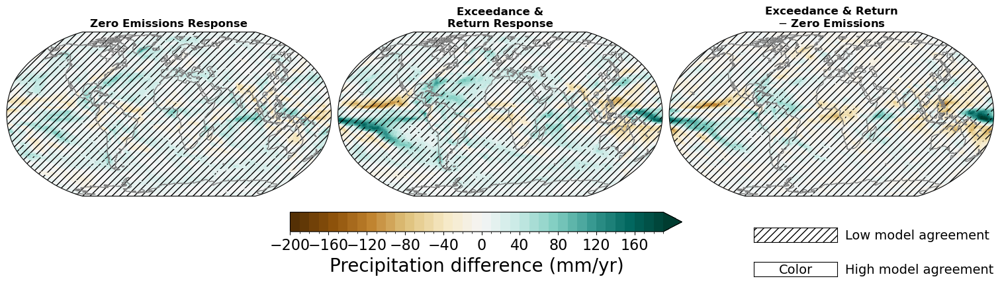

In [ ]:
fig, axs = plt.subplots(1,3, figsize=(15, 5),
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=0)},
                       constrained_layout=True)

min_sign_agreement = 9

sign_agreement_zec = (((pr_regridded_datarray.isel(exp=1)-pr_regridded_datarray.isel(exp=0)) > 0.).sum(dim='model') >= min_sign_agreement) + (((pr_regridded_datarray.isel(exp=1)-pr_regridded_datarray.isel(exp=0)) < 0.).sum(dim='model') >= min_sign_agreement)
sign_agreement_cdr = (((pr_regridded_datarray.isel(exp=2)-pr_regridded_datarray.isel(exp=0)) > 0.).sum(dim='model') >= min_sign_agreement) + (((pr_regridded_datarray.isel(exp=2)-pr_regridded_datarray.isel(exp=0)) < 0.).sum(dim='model') >= min_sign_agreement)
sign_agreement_cmz = (((pr_regridded_datarray.isel(exp=2)-pr_regridded_datarray.isel(exp=1)) > 0.).sum(dim='model') >= min_sign_agreement) + (((pr_regridded_datarray.isel(exp=2)-pr_regridded_datarray.isel(exp=1)) < 0.).sum(dim='model') >= min_sign_agreement)

p = (pr_regridded_datarray.mean(dim='model').isel(exp=1)-pr_regridded_datarray.mean(dim='model').isel(exp=0)).plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
axs[0].add_feature(feature.COASTLINE, edgecolor='grey')

axs[0].contourf(
    sign_agreement_zec.lon, sign_agreement_zec.lat, 1.-sign_agreement_zec,
    transform=ccrs.PlateCarree(),
    colors='none',
    levels=[.5, 1.5],
    hatches=('///','///'))

axs[0].set_title('Zero Emissions Response', fontweight='bold')
    
p = (pr_regridded_datarray.mean(dim='model').isel(exp=2)-pr_regridded_datarray.mean(dim='model').isel(exp=0)).plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
axs[1].add_feature(feature.COASTLINE, edgecolor='grey')


axs[1].contourf(
    sign_agreement_zec.lon, sign_agreement_zec.lat, 1.-sign_agreement_cdr,
    transform=ccrs.PlateCarree(),
    colors='none',
    levels=[.5, 1.5],
    hatches=('///','///'))

axs[1].set_title('Exceedance &\nReturn Response', fontweight='bold')

p = (pr_regridded_datarray.mean(dim='model').isel(exp=2)-pr_regridded_datarray.mean(dim='model').isel(exp=1)).plot(ax=axs[2], transform=ccrs.PlateCarree(), add_colorbar=False, levels=precip_levs, cmap=cmap)
axs[2].add_feature(feature.COASTLINE, edgecolor='grey')

axs[2].contourf(
    sign_agreement_zec.lon, sign_agreement_zec.lat, 1.-sign_agreement_cmz,
    transform=ccrs.PlateCarree(),
    colors='none',
    levels=[.5, 1.5],
    hatches=('///','///'))

axs[2].set_title('Exceedance & Return\n$\minus$ Zero Emissions', fontweight='bold')

cbar = fig.colorbar(p, ax=axs.ravel().tolist(), orientation='horizontal', fraction=0.08, pad=0.06, label='Precipitation difference (mm/yr)')
cbar.ax.tick_params(labelsize=16) # Large font for tick labels
cbar.set_label('Precipitation difference (mm/yr)', fontsize=20) # Large font for the label


ax6 = fig.add_subplot(22,10,200)
ax6.contourf([0,1,2],[0,1,2],np.ones((3,3))*1.,levels=[0.5,2],
             colors='none',
             hatches=['///'], 
             alpha=0.00)
ax6.xaxis.set_visible(False)
ax6.yaxis.set_visible(False)
ax6.text(2.2,0.9,'Low model agreement', verticalalignment='center', fontsize=14)

ax7 = fig.add_subplot(22,10,220)
ax7.contourf([0,1,2],[0,1,2],np.ones((3,3))*0.,levels=[0.5,2],
             colors='none',
             hatches=['///'], 
             alpha=0.00)
ax7.xaxis.set_visible(False)
ax7.yaxis.set_visible(False)
ax7.text(2.2,0.9,'High model agreement', verticalalignment='center', fontsize=14)
ax7.text(1,0.9,'Color', verticalalignment='center', horizontalalignment='center', fontsize=14)


plt.savefig('fig_precip_response_maps_ensemblemean.png', dpi=300, bbox_inches='tight')


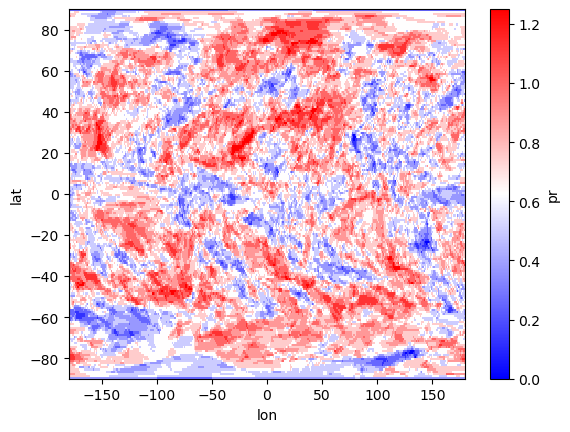

In [23]:
sign_agreement_zec =  (pr_regridded_datarray.isel(exp=1)-pr_regridded_datarray.isel(exp=0)) > 0.
(sign_agreement_zec.sum(dim='model')/8.).plot(cmap='bwr')


/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/4282515524.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


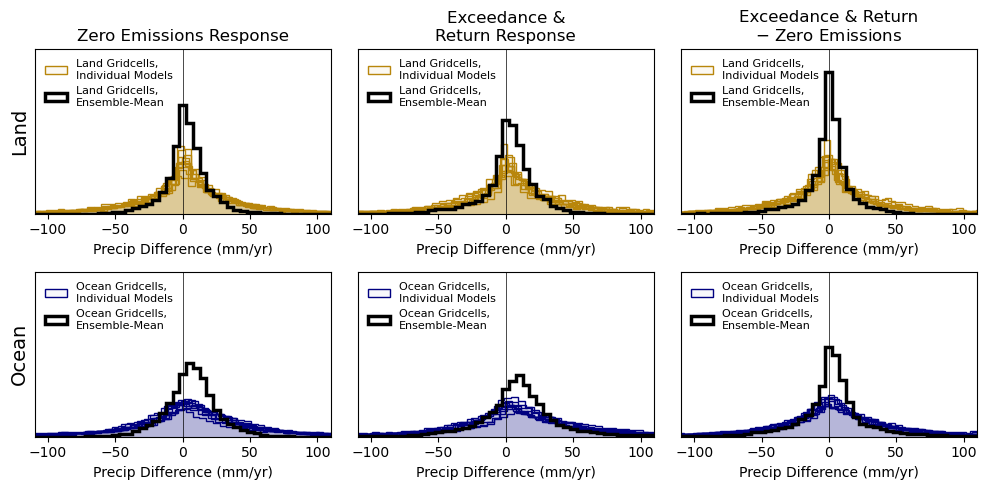

In [24]:
fig, axs_array = plt.subplots(2, 3, figsize=(10, 5),
                       constrained_layout=True)

axs = axs_array.flatten()

landmask_threshold = 0.1

landface = mcolors.to_rgba(landcolor, alpha=0.05)
oceanface = mcolors.to_rgba(oceancolor, alpha=0.03)

for model_i, model in enumerate(models_list):
    if model_i == 0:
        label_land = 'Land Gridcells,\nIndividual Models'
        label_ocean = 'Ocean Gridcells,\nIndividual Models'
    else:
        label_land = None
        label_ocean = None     
    #
    bin_edges = np.linspace(-1000,1000,400) + random.uniform(-10, 10)
    #
    # define land mask
    landmask = (landmasks_dict[model] > landmask_threshold * landmasks_dict[model].max()).values.flatten()
    #
    data = data_dict[model]
    x = (data[1]-data[0]).values.flatten()
    y = (data[2]-data[0]).values.flatten()
    #
    weights = areas_dict[model].values.flatten()
    #
    axs[0].hist(x[landmask], edgecolor=landcolor, histtype='step', density=True, bins=bin_edges, weights=weights[landmask], fill=True, facecolor=landface, label=label_land)
    #
    axs[1].hist(y[landmask], edgecolor=landcolor, histtype='step', density=True, bins=bin_edges, weights=weights[landmask], fill=True, facecolor=landface, label=label_land)
    #
    axs[2].hist((y-x)[landmask], edgecolor=landcolor, histtype='step', density=True, bins=bin_edges, weights=weights[landmask], fill=True, facecolor=landface, label=label_land)
    #
    axs[3].hist(x[~landmask], edgecolor=oceancolor, histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], fill=True, facecolor=oceanface, label=label_ocean)
    #
    axs[4].hist(y[~landmask], edgecolor=oceancolor, histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], fill=True, facecolor=oceanface, label=label_ocean)
    #
    axs[5].hist((y-x)[~landmask], edgecolor=oceancolor, histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], fill=True, facecolor=oceanface, label=label_ocean)
    #

## ensemble mean distributions
x = (pr_regridded_datarray.isel(exp=1)-pr_regridded_datarray.isel(exp=0)).mean(dim='model').values.flatten()
y = (pr_regridded_datarray.isel(exp=2)-pr_regridded_datarray.isel(exp=0)).mean(dim='model').values.flatten()
     
landmask = (landfrac_regridded_dataarray.mean(dim='model') > landmask_threshold).values.flatten()
weights = (area_regridded_dataarray.mean(dim='model')).values.flatten()

bin_edges = np.linspace(-1000,1000,400) 
axs[0].hist(x[landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[landmask], linewidth=2.5, label = 'Land Gridcells,\nEnsemble-Mean')
axs[1].hist(y[landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[landmask], linewidth=2.5, label = 'Land Gridcells,\nEnsemble-Mean')
axs[2].hist((y-x)[landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[landmask], linewidth=2.5, label = 'Land Gridcells,\nEnsemble-Mean')

axs[3].hist(x[~landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], linewidth=2.5, label = 'Ocean Gridcells,\nEnsemble-Mean')
axs[4].hist(y[~landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], linewidth=2.5, label = 'Ocean Gridcells,\nEnsemble-Mean')
axs[5].hist((y-x)[~landmask], edgecolor='black', histtype='step', density=True, bins=bin_edges, weights=weights[~landmask], linewidth=2.5, label = 'Ocean Gridcells,\nEnsemble-Mean')

panel_labels = ['Zero Emissions Response','Exceedance &\nReturn Response','Exceedance & Return\n$\minus$ Zero Emissions']
for ax_x in range(len(axs)):
    axs[ax_x].vlines(0, ymin=0,ymax=1, transform=axs[ax_x].get_xaxis_transform(), color='black', linewidth=0.5)
    #
    axs[ax_x].set_xlim(-110,110)
    axs[ax_x].set_ylim(0,6e-2)
    #
    axs[ax_x].set_xlabel('Precip Difference (mm/yr)')
    axs[ax_x].tick_params(axis='y', left=False, labelleft=False)
    #
    if ax_x < 3:
        axs[ax_x].set_title(panel_labels[ax_x])
    if ax_x == 0:
        axs[ax_x].set_ylabel('Land', fontsize=14)
    if ax_x == 3:
        axs[ax_x].set_ylabel('Ocean', fontsize=14)
    axs[ax_x].legend(fontsize=8, frameon=False, loc='upper left')

    
plt.tight_layout()

plt.savefig('fig_precip_response_landocean_histograms.png', dpi=300, bbox_inches='tight')



In [25]:
print(weighted_median(x[landmask], weights[landmask]))
print(weighted_median(y[landmask], weights[landmask]))
print(weighted_median((y-x)[landmask], weights[landmask]))

print()

print(weighted_median(x[~landmask], weights[~landmask]))
print(weighted_median(y[~landmask], weights[~landmask]))
print(weighted_median((y-x)[~landmask], weights[~landmask]))


2.24996337890625
3.138663387298584
0.5448120117187507

6.45369873046875
9.1992919921875
2.3638671875000004


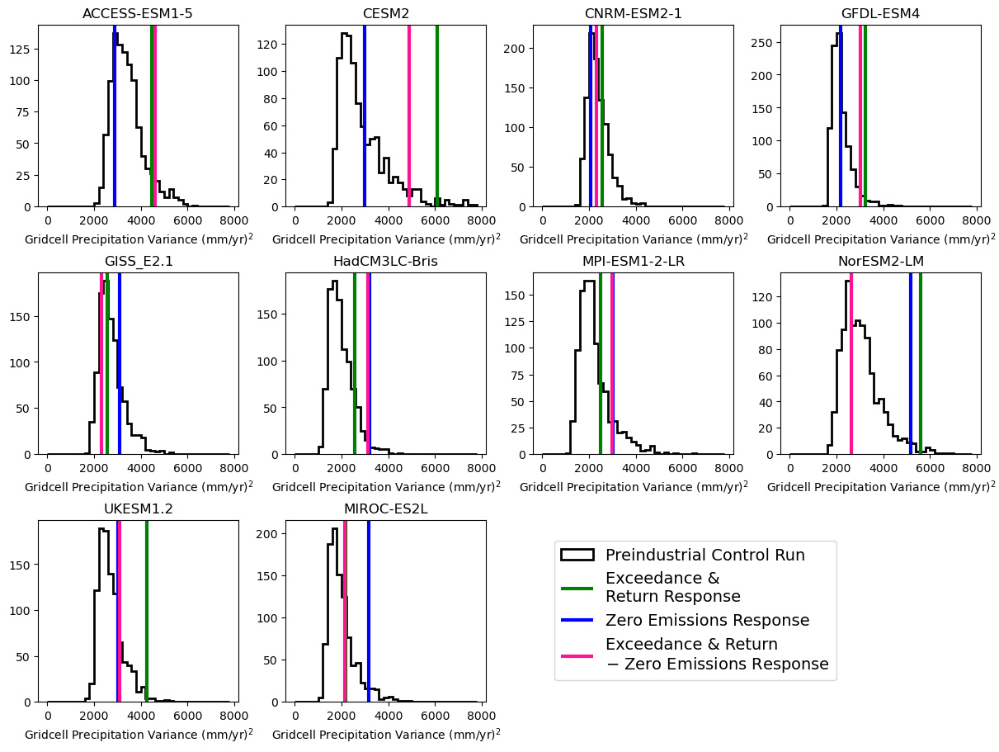

In [26]:
fig, axs = plt.subplots(3,4, figsize=(12, 9),
                       constrained_layout=True)
axs_flat = axs.flatten()
                        
for model_i, model in enumerate(models_list):
    variances_dict[model].plot.hist(histtype='step', label='Preindustrial Control Run', bins=np.arange(40)*8000/40, ax=axs_flat[model_i], lw=2, color='black')
    #plt.vlines(variance_cdr_response[model], ymin=100,ymax=500)
    axs_flat[model_i].vlines(variance_cdr_response[model], ymin=0,ymax=1, transform=axs_flat[model_i].get_xaxis_transform(),  label='Exceedance &\nReturn Response', color='Green', lw=3)
    axs_flat[model_i].vlines(variance_zec_response[model], ymin=0,ymax=1, transform=axs_flat[model_i].get_xaxis_transform(), label='Zero Emissions Response', color='Blue', lw=3)
    axs_flat[model_i].vlines(variance_unshared[model], ymin=0,ymax=1, transform=axs_flat[model_i].get_xaxis_transform(), label='Exceedance & Return\n$\minus$ Zero Emissions Response', color='deeppink', lw=3)
    axs_flat[model_i].set_title(model)
    if model_i == len(models_list)-1:
        legend = axs_flat[model_i].legend(loc='center left', bbox_to_anchor=(1.3, 0.5), fontsize=14)
        legend.set_in_layout(False)
    axs_flat[model_i].set_xlabel('Gridcell Precipitation Variance (mm/yr)$^2$')
    
axs_flat[10].axis('off')
axs_flat[11].axis('off')

plt.savefig('fig_precip_response_histograms.png', dpi=300, bbox_inches='tight')


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

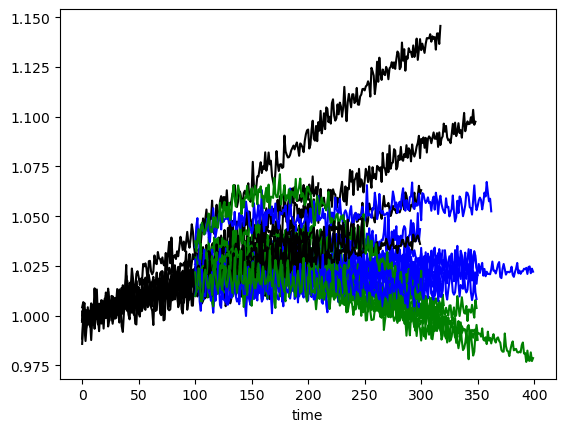

In [27]:
for model_i, model in enumerate(models_list):
    data = data_dict_ts[model]
    baseline = data[0].isel(time=slice(0,20)).mean()
    (data[0]/baseline).plot(c='black')
    (data[1]/baseline).plot(c='blue')
    (data[2]/baseline).plot(c='green')

In [28]:
def savgol_filter(array, window, order=2):
        smooth_array = array.copy()
        smooth_array[:] = scipy.signal.savgol_filter(array, window, order)
        return(smooth_array)

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

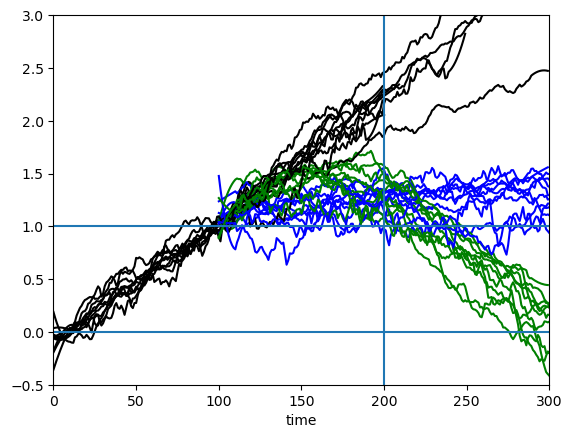

In [29]:
for model_i, model in enumerate(models_list):
    data = data_dict_ts[model]
    baseline = data[0].isel(time=slice(0,20)).mean()
    scaling = data[0].isel(time=slice(90,110)).mean() - data[0].isel(time=slice(0,20)).mean()
    savgol_filter((data[0]-baseline)/scaling, 21).plot(c='black')
    savgol_filter((data[1]-baseline)/scaling, 21).plot(c='blue')
    savgol_filter((data[2]-baseline)/scaling, 21).plot(c='green')
    
plt.xlim(0,300)
plt.ylim(-0.5,3)
plt.hlines([0,1], 0, 300)
plt.vlines(200, -0.5,3)

In [30]:
precip_ts_datarray = xr.DataArray(
    np.zeros([300,3,nmodels])/np.zeros([300,3,nmodels]),
    coords={"time": np.arange(300), "exp": np.arange(3), "model": np.arange(nmodels)},
    dims=("time", "exp", "model"),
    name='Precip',
    attrs=dict(
        description="Global Mean Precipitation",
        units="kg/m2/s",
    ))

normalized_precip_ts_datarray = precip_ts_datarray.copy()

for model_i, model in enumerate(models_list):
    precip_ts_datarray[0:len(data_dict_ts[model][0].isel(time=slice(0,300))),0,model_i] = data_dict_ts[model][0].isel(time=slice(0,300))
    precip_ts_datarray[100:,1,model_i] = data_dict_ts[model][1].isel(time=slice(0,200))
    precip_ts_datarray[100:,2,model_i] = data_dict_ts[model][2].isel(time=slice(0,200))
    #
    baseline = data_dict_ts[model][0].isel(time=slice(0,20)).mean()
    scaling = data_dict_ts[model][0].isel(time=slice(90,110)).mean() - data_dict_ts[model][0].isel(time=slice(0,20)).mean()
    normalized_precip_ts_datarray[:,:,model_i] = (precip_ts_datarray[:,:,model_i] - baseline)/scaling

/var/folders/6g/x_x6jm6s1jq6fz2gmv70hhdh0000gp/T/ipykernel_70738/333657326.py:2: RuntimeWarning: invalid value encountered in divide
  np.zeros([300,3,nmodels])/np.zeros([300,3,nmodels]),
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't op

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

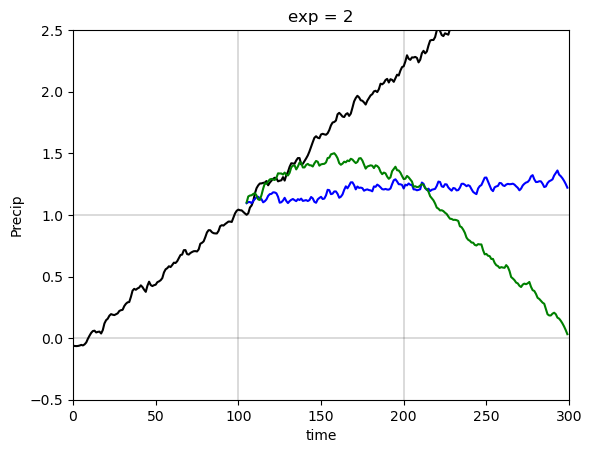

In [31]:
savgol_filter(normalized_precip_ts_datarray.mean(dim='model').isel(exp=0), 11).plot(c='black')
savgol_filter(normalized_precip_ts_datarray.mean(dim='model').isel(exp=1), 11).plot(c='blue')
savgol_filter(normalized_precip_ts_datarray.mean(dim='model').isel(exp=2), 11).plot(c='green')

plt.xlim(0,300)
plt.ylim(-0.5,2.5)
plt.hlines([0,1], 0, 300, color='black', linewidths=0.2)
plt.vlines([100,200], -0.5,3, color='black', linewidths=0.2)

In [32]:
precip_ts_datarray.to_netcdf('precip_globalmean_timeseries_flat10mip.nc')

In [33]:
nmodels

10

In [34]:
regridded_picontrols_dict = {}
for model_i, model in enumerate(models_list):
    
    ntime = len(picontrols_dict[model].time)

    data = picontrols_dict[model]
    data['time'] = np.arange(ntime)
    #
    #need to add cyclic point before regridding
    wrap_data, wrap_lons = add_cyclic_point(data, coord=data.lon.as_numpy())
    #
    wrap_dataarray = xr.DataArray(wrap_data, 
        coords={ "time":data.time, "lat": data.lat, "lon": wrap_lons},
        dims=( "time", "lat", "lon"),
        name='pr')
    #
    regridder = xe.Regridder(wrap_dataarray.to_dataset(), ds_out, 'bilinear') # Or 'conservative', 'nearest_s2d', etc. [2, 9]
    ds_regridded = regridder(wrap_dataarray.to_dataset(), keep_attrs=True) # keep_attrs preserves metadata [4, 5]
    #picontrol_tas_regridded_datarray[:,:,j,model_i] = ds_regridded.to_array().squeeze()
    print(ds_regridded)
    #
    regridded_picontrols_dict[model] = ds_regridded['pr']


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 68.67 68.57 68.47 68.38 ... 215.7 215.8 215.6
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 61.47 61.57 61.63 61.69 ... 221.2 221.3 221.3
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 61.12 61.12 61.12 61.12 ... 224.3 224.3 224.3
Attributes:
    regrid_method:  bilinear
<xarray.Dataset>
Dimensions:  (time: 170, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 162 163 164 165 166 167 168 169
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    regrid_method:  bilinear
<xarray.Dataset>
Dimensions:  (time: 449, y:

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 501, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 493 494 495 496 497 498 499 500
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 67.58 67.78 67.99 68.23 ... 166.3 166.2 166.1
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    regrid_method:  bilinear


HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

<xarray.Dataset>
Dimensions:  (time: 500, y: 180, x: 360)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x
Data variables:
    pr       (time, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    regrid_method:  bilinear


In [35]:
regridded_picontrols_dict

{'ACCESS-ESM1-5': <xarray.DataArray 'pr' (time: 500, y: 180, x: 360)>
 array([[[ 68.67405118,  68.56798704,  68.4694149 , ...,  68.89215049,
           68.81043778,  68.7548763 ],
         [ 64.11022255,  63.99834858,  63.91372948, ...,  64.54425149,
           64.34371548,  64.22534443],
         [ 43.59814083,  44.09514845,  44.66411851, ...,  43.58990589,
           43.39776836,  43.36561295],
         ...,
         [220.39494949, 220.49841006, 220.44190713, ..., 219.86929966,
          220.38630984, 220.35753904],
         [224.69798973, 224.85461735, 224.75260344, ..., 224.74679671,
          225.02689428, 224.75541741],
         [214.60942319, 214.67725621, 214.63218591, ..., 214.68645743,
          214.77457871, 214.64186732]],
 
        [[ 65.73389666,  65.70231765,  65.68853458, ...,  65.66369621,
           65.69529868,  65.73155677],
         [ 58.75165336,  58.75665891,  58.83507915, ...,  58.53196497,
           58.58854648,  58.69560553],
         [ 31.92373277,  32.26056

In [36]:
#n_samples = 1000
#rng = np.random.default_rng()
#sampling_length = averaging_length
#quantile_to_use = .05

pictrl_ensmean_pr_regridded_datarray_1 = xr.DataArray(
    np.zeros([n_samples,nmodels,180,360]),
    coords={"ens":np.arange(n_samples), "model": np.arange(nmodels), "lat": np.arange(180)-89.5, "lon": np.arange(360)-179.5},
    dims=("ens", "model", "lat", "lon"),
    name='pr',
    attrs=dict(
        description="Surface Air Temperature",
        units="K",
    ))

pictrl_ensmean_pr_regridded_datarray_2 = xr.DataArray(
    np.zeros([n_samples,nmodels,180,360]),
    coords={"ens":np.arange(n_samples), "model": np.arange(nmodels), "lat": np.arange(180)-89.5, "lon": np.arange(360)-179.5},
    dims=("ens", "model", "lat", "lon"),
    name='pr',
    attrs=dict(
        description="Surface Air Temperature",
        units="K",
    ))

for model_i, model in enumerate(models_list):
    n_startingyears = len(regridded_picontrols_dict[model].time) - sampling_length
    starting_indices_1 = rng.integers(low=0, high=n_startingyears, size=n_samples*2)  
    starting_indices_2 = rng.integers(low=0, high=n_startingyears, size=n_samples*2)  
    i_sample = 0
    i_counter = 0
    while i_sample < n_samples:
        if i_sample%200 == 0:
            print(model + ': '+str(i_sample))
        a = starting_indices_1[i_counter]
        b = starting_indices_2[i_counter]
        if abs(a - b) > sampling_length:
            pictrl_ensmean_pr_regridded_datarray_1[i_sample,model_i,:,:] = regridded_picontrols_dict[model].isel(time=slice(a,a+sampling_length)).mean(dim='time')/float(nmodels)
            pictrl_ensmean_pr_regridded_datarray_2[i_sample,model_i,:,:] = regridded_picontrols_dict[model].isel(time=slice(b,b+sampling_length)).mean(dim='time')/float(nmodels)
            i_sample = i_sample+1
        i_counter = i_counter + 1

    

ACCESS-ESM1-5: 0
ACCESS-ESM1-5: 0
ACCESS-ESM1-5: 200
ACCESS-ESM1-5: 400
ACCESS-ESM1-5: 600
ACCESS-ESM1-5: 800
CESM2: 0
CESM2: 200
CESM2: 400
CESM2: 600
CESM2: 800
CNRM-ESM2-1: 0
CNRM-ESM2-1: 200
CNRM-ESM2-1: 400
CNRM-ESM2-1: 600
CNRM-ESM2-1: 800
GFDL-ESM4: 0
GFDL-ESM4: 200
GFDL-ESM4: 400
GFDL-ESM4: 600
GFDL-ESM4: 800
GISS_E2.1: 0
GISS_E2.1: 200
GISS_E2.1: 200
GISS_E2.1: 400
GISS_E2.1: 400
GISS_E2.1: 400
GISS_E2.1: 400
GISS_E2.1: 600
GISS_E2.1: 800
HadCM3LC-Bris: 0
HadCM3LC-Bris: 200
HadCM3LC-Bris: 400
HadCM3LC-Bris: 600
HadCM3LC-Bris: 800
MPI-ESM1-2-LR: 0
MPI-ESM1-2-LR: 200
MPI-ESM1-2-LR: 400
MPI-ESM1-2-LR: 600
MPI-ESM1-2-LR: 800
NorESM2-LM: 0
NorESM2-LM: 0
NorESM2-LM: 200
NorESM2-LM: 400
NorESM2-LM: 600
NorESM2-LM: 800
UKESM1.2: 0
UKESM1.2: 200
UKESM1.2: 400
UKESM1.2: 600
UKESM1.2: 800
MIROC-ES2L: 0
MIROC-ES2L: 0
MIROC-ES2L: 200
MIROC-ES2L: 400
MIROC-ES2L: 600
MIROC-ES2L: 800


In [37]:
ens_mean_pictrl_diff = pictrl_ensmean_pr_regridded_datarray_1.mean(dim="model") - pictrl_ensmean_pr_regridded_datarray_2.mean(dim="model")


In [38]:
land_medians = np.zeros(n_samples)
ocean_medians = np.zeros(n_samples)
for i_ens in range(n_samples):
    land_medians[i_ens] = weighted_median(ens_mean_pictrl_diff.isel(ens=i_ens).values.flatten()[landmask], weights[landmask])
    ocean_medians[i_ens] = weighted_median(ens_mean_pictrl_diff.isel(ens=i_ens).values.flatten()[~landmask], weights[~landmask])
    

In [39]:
print(np.quantile(land_medians, .05))
print(np.quantile(land_medians, .95))
print(np.quantile(ocean_medians, .05))
print(np.quantile(ocean_medians, .95))


-0.16463668366411185
0.15093570596438538
-0.1333416026291303
0.13621703230241664
